Importing all the libraries that we will needed for machine learning

In [1]:
# Importing libraries 
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage import data, color, img_as_float, img_as_ubyte, filters, feature
from skimage import draw as drw
import matplotlib.ticker as plticker
from PIL import Image, ImageDraw
import matplotlib.patches as patches
import csv
import math
%matplotlib inline
from IPython.display import HTML, display
import numpy as np
from sklearn import preprocessing, cross_validation, neighbors
import pandas as pd
from pandas import DataFrame
import csv
from skimage import data, color, img_as_float, img_as_ubyte, filters, feature
import matplotlib.pyplot as plt
from numpy import genfromtxt
from sklearn import preprocessing
import timeit
from random import randint
from sklearn.feature_extraction import image
import os

/Applications/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


                                            Control Pane
Code block bellow is used to choose patch size, number of image pairs we will train on, and number of random pixels will be compared between retina images and ground truth 

In [2]:
# Choosing grind size
grid_size = 2

# Number of images used to generate training set, max number is 20! no more image pairs than 20 in the folder  
num_images = 20    

# Number of randomly picked pixels from each image 
rand_pix = 20000


                                           PATCHES FUNCTION
    Function that analyses region in Retina Image, Compares is to Ground Truth then gives it a class of 0 or 1 

In [3]:
# Function takes in grey scale retina image, grey scale ground truth image and number of patches will be compared
# in each image pair 
def random_patches(retina_image, ground_truth,rand_pix):
    for x in range(0,rand_pix):
    
        # Retina image patches 
        patches_retina_image = image.extract_patches_2d(retina_image, (grid_size, grid_size))
        # Find max number of patches in the image that can be compared
        number_of_patches = patches_retina_image.shape[0]
        #Random int generator, this it to reference to random locations in the image  
        random_integer = randint(0, number_of_patches-1)
        
        # Retina image patch array flattened 
        arr_img = patches_retina_image[random_integer].flatten()
       
    
    
   
        # Ground truth patches 
        patches_ground_truth = image.extract_patches_2d(ground_truth, (grid_size, grid_size))
        # Flatten ground truth patch into flat array  
        arr_gt = patches_ground_truth[random_integer].flatten()
    
        # Mean value of ground truth patch, if its more than 0(zero) then there is vessel in that patch 
        mean_array_value = np.mean(arr_gt)
    
    
        # Append class label to the flat array 0 or 1, if there is vessel in the patch put 1 at the end of flat array
        # else put 0 
        if mean_array_value>0:
            arr_img=np.append(arr_img, 1)
        else:
             arr_img=np.append(arr_img, 0)
    
    
        # verticaly stack patch arrays to form matrix 
        stokes_line = arr_img
        stokes_list.append(stokes_line)

    # Store verticaly stacked arrays (matrix) in a variable 
    big_stokes = np.vstack(stokes_list)
    #print(big_stokes)
    
    #return this matrix for other functions to be used latter 
    return big_stokes

                                      REFERENCING IMAGES FOLDERS
Accessing folders with Retina Images and Ground Truth Images, using "os.lisdir", displaying number of image pairs we can use

In [4]:
# Storing retina image folder name in data_dir_normal array and arranging it in order by image number  
data_dir_normal = 'Retina_Images'
x = sorted(os.listdir(data_dir_normal))

# Storing ground truth image folder name in data_dir_gt array and arranging it in order by image number
data_dir_gt = 'Ground_Truth_Images'
y = sorted(os.listdir(data_dir_gt))

# number of images we are dealing with
number_img = len(y)
print("{} {} {} {} {}".format("There are", number_img,"images in",data_dir_gt,"folder")) 


There are 20 images in Ground_Truth_Images folder


                                          LOOPING THROUGH IMAGES 
                              Analysing patches randomly image pair by image pair 

Retina_Images/21_training.tif
Ground_Truth_Images/21_manual1.gif


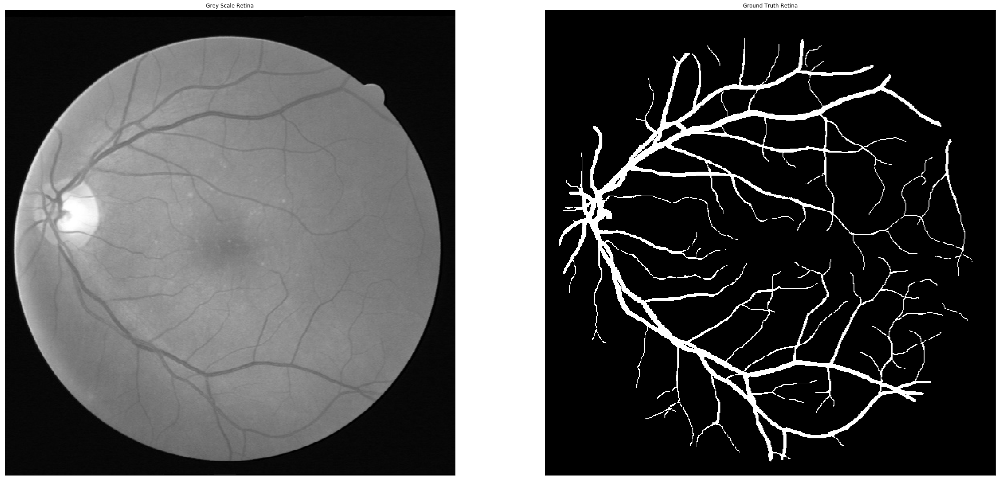

Retina_Images/22_training.tif
Ground_Truth_Images/22_manual1.gif


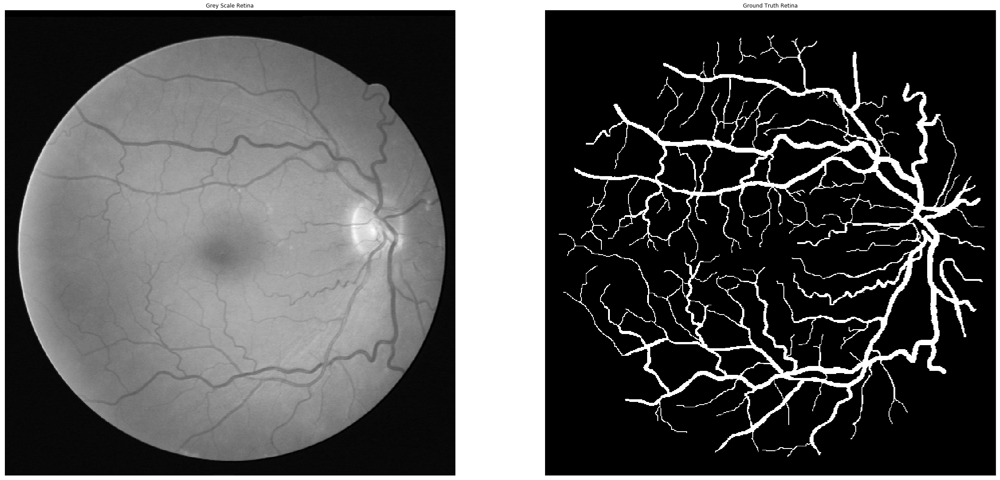

Retina_Images/23_training.tif
Ground_Truth_Images/23_manual1.gif


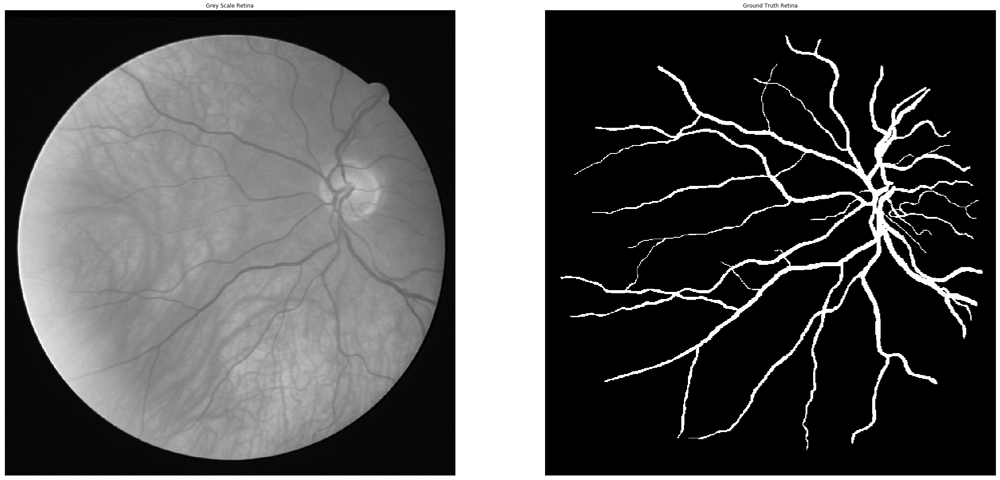

Retina_Images/24_training.tif
Ground_Truth_Images/24_manual1.gif


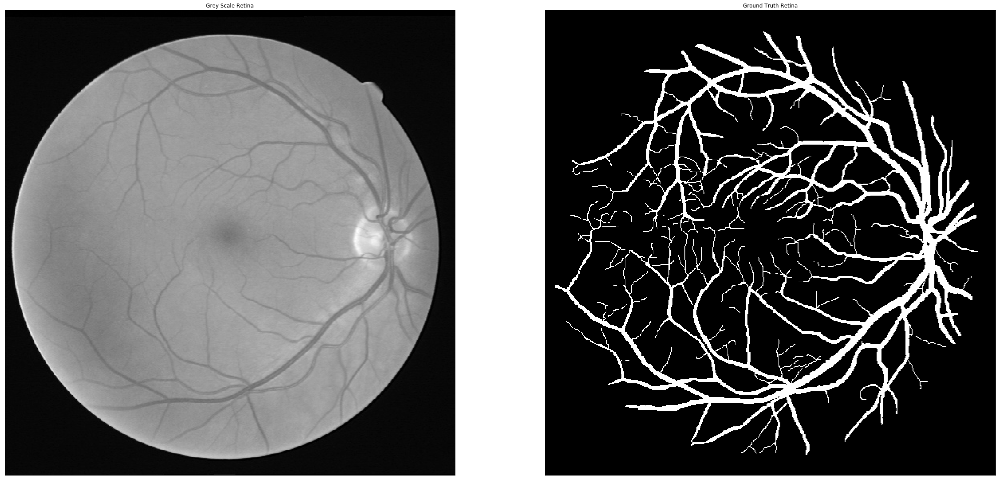

Retina_Images/25_training.tif
Ground_Truth_Images/25_manual1.gif


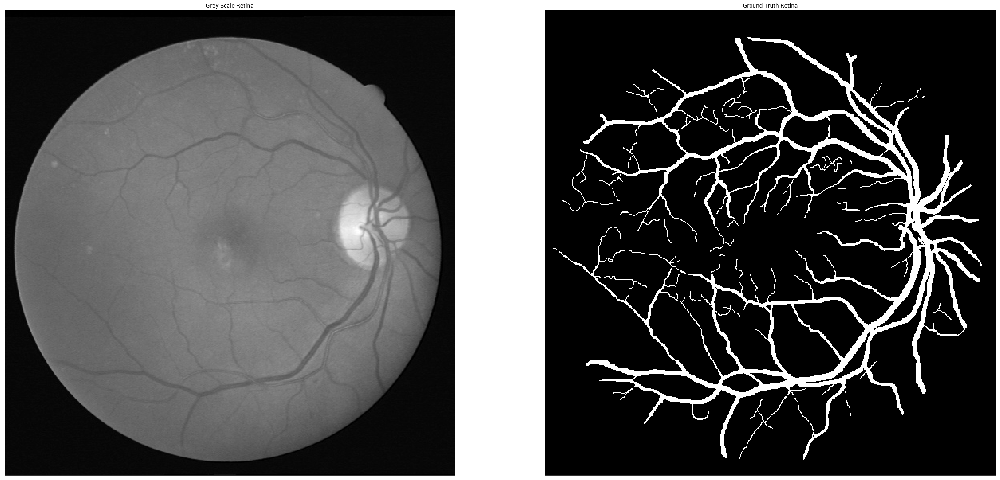

Retina_Images/26_training.tif
Ground_Truth_Images/26_manual1.gif


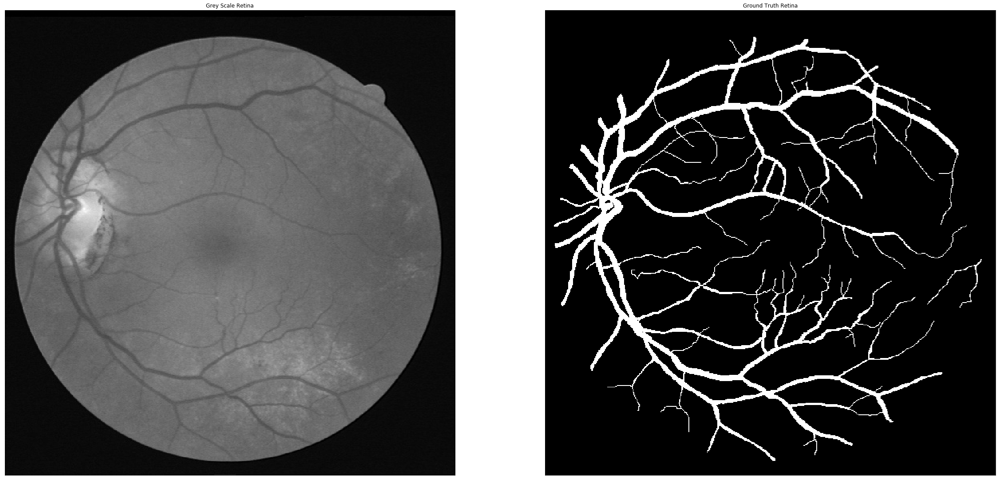

Retina_Images/27_training.tif
Ground_Truth_Images/27_manual1.gif


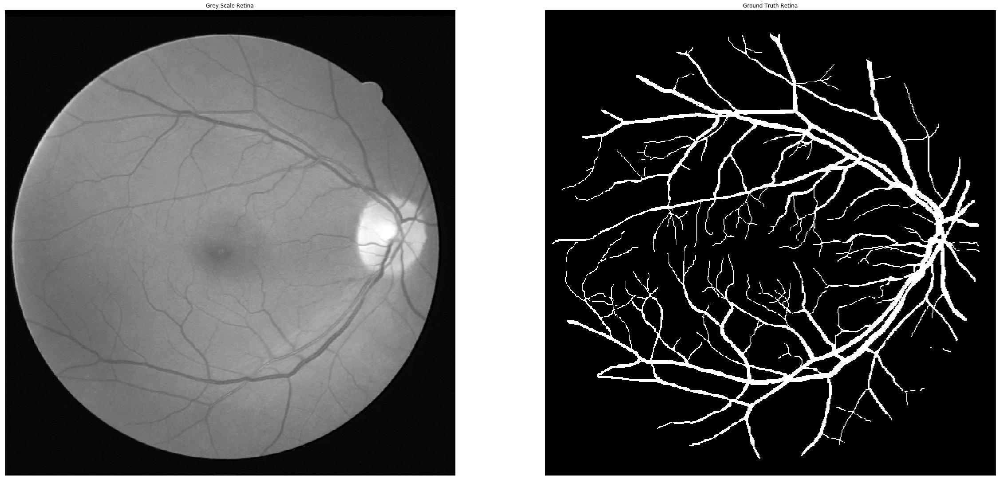

Retina_Images/28_training.tif
Ground_Truth_Images/28_manual1.gif


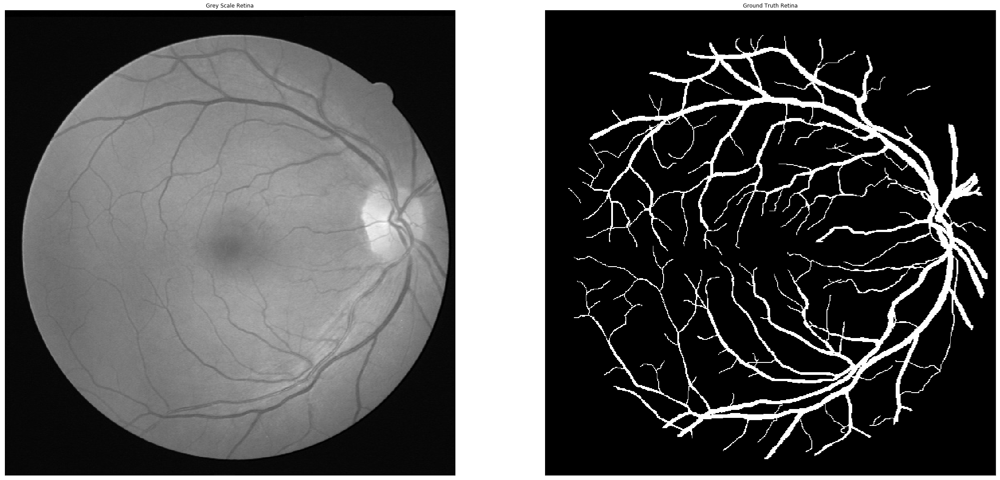

Retina_Images/29_training.tif
Ground_Truth_Images/29_manual1.gif


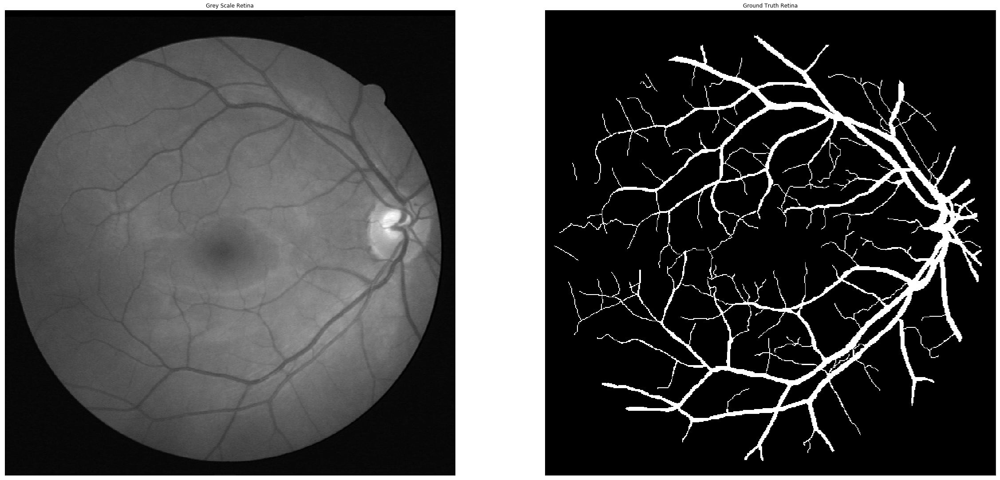

Retina_Images/30_training.tif
Ground_Truth_Images/30_manual1.gif


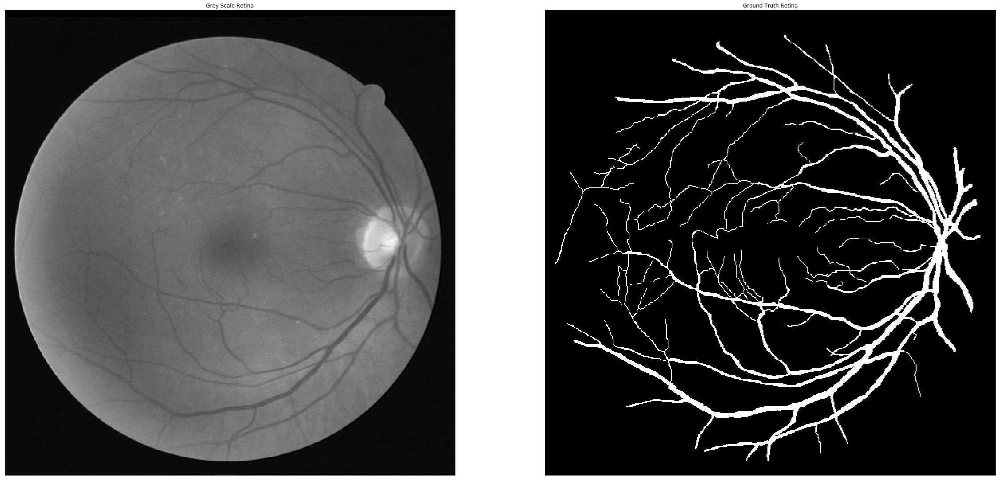

Retina_Images/31_training.tif
Ground_Truth_Images/31_manual1.gif


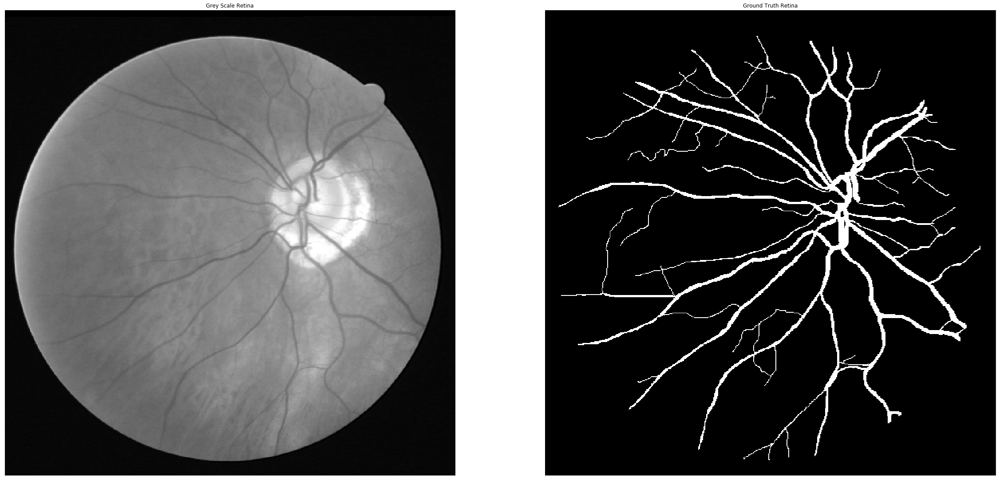

Retina_Images/32_training.tif
Ground_Truth_Images/32_manual1.gif


/Applications/anaconda3/lib/python3.6/site-packages/skimage/external/tifffile/tifffile.py:2611: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


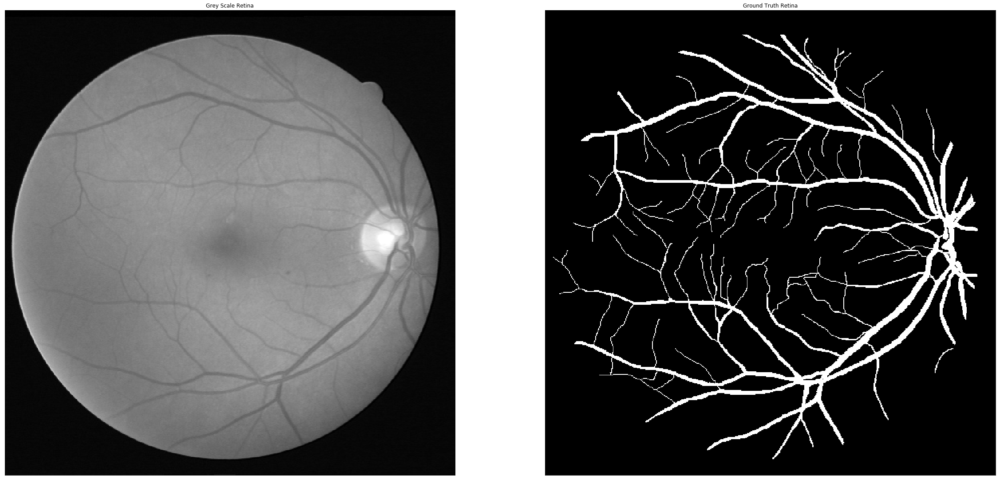

Retina_Images/33_training.tif
Ground_Truth_Images/33_manual1.gif


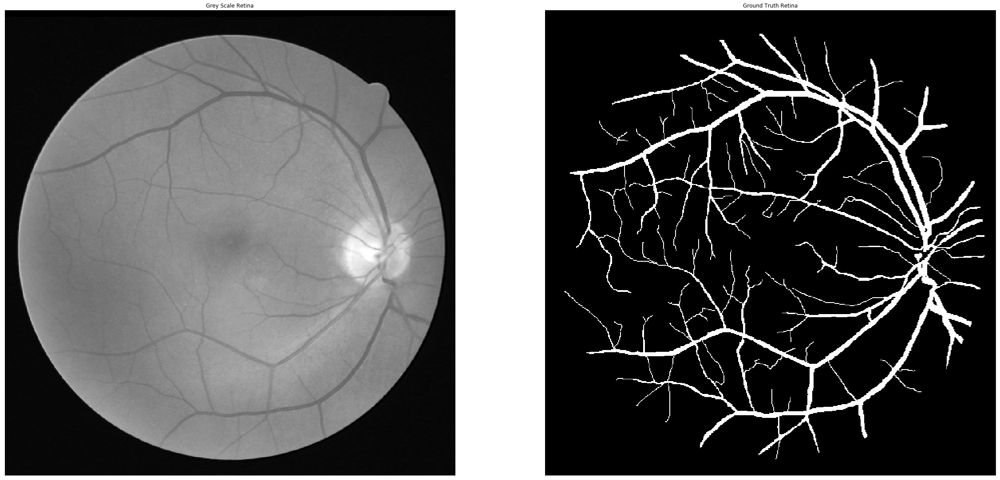

Retina_Images/34_training.tif
Ground_Truth_Images/34_manual1.gif


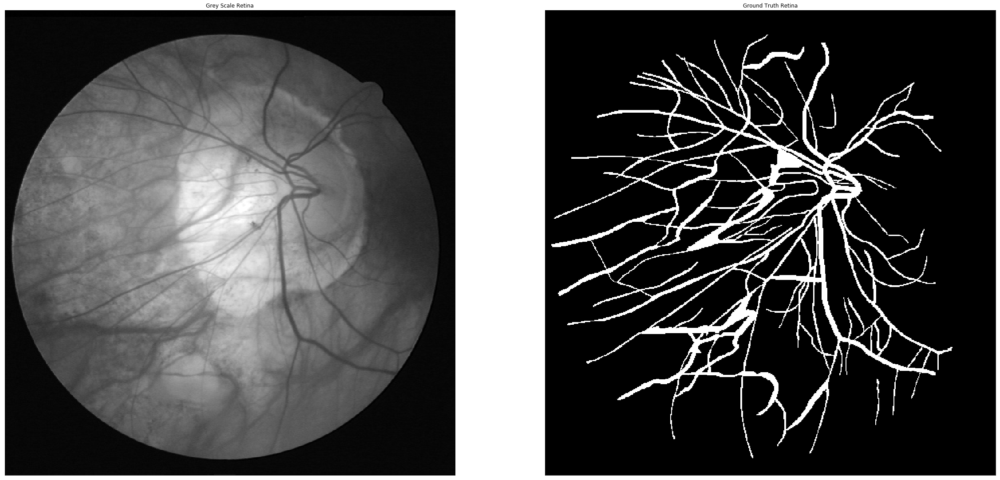

Retina_Images/35_training.tif
Ground_Truth_Images/35_manual1.gif


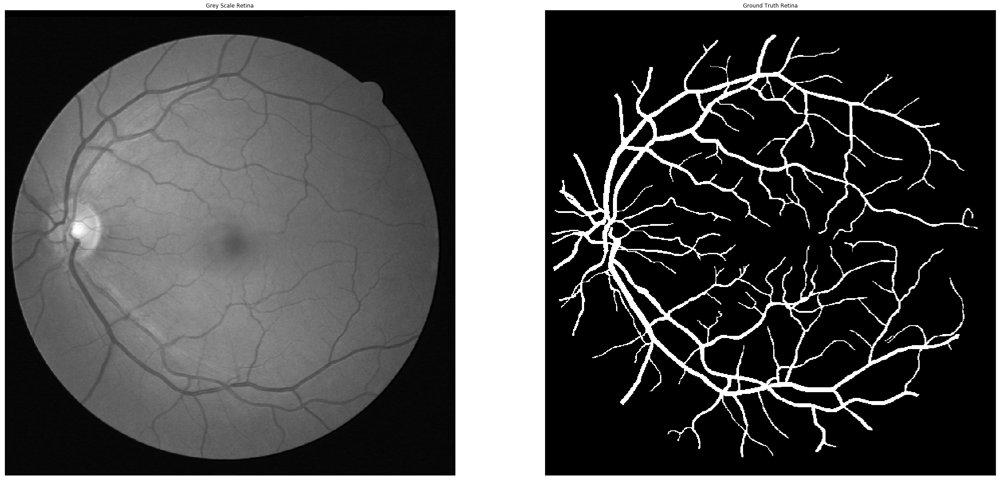

Retina_Images/36_training.tif
Ground_Truth_Images/36_manual1.gif


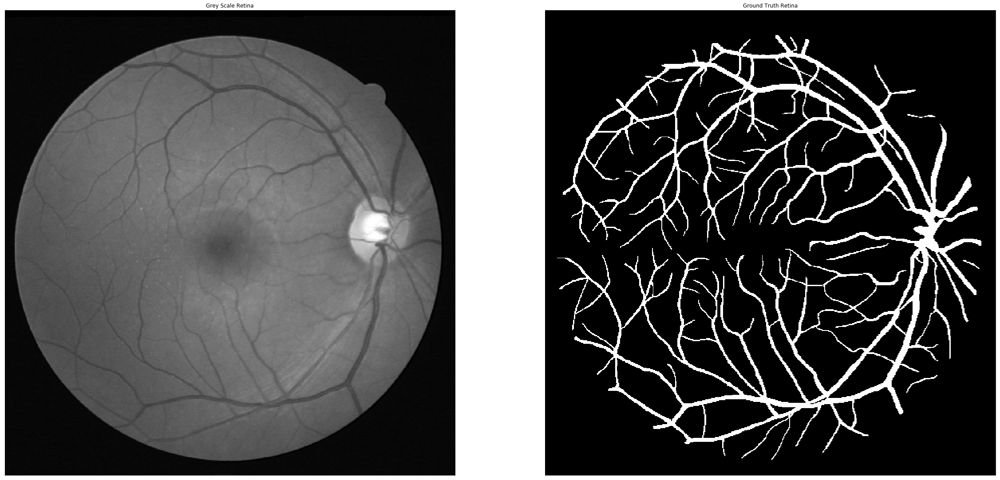

Retina_Images/37_training.tif
Ground_Truth_Images/37_manual1.gif


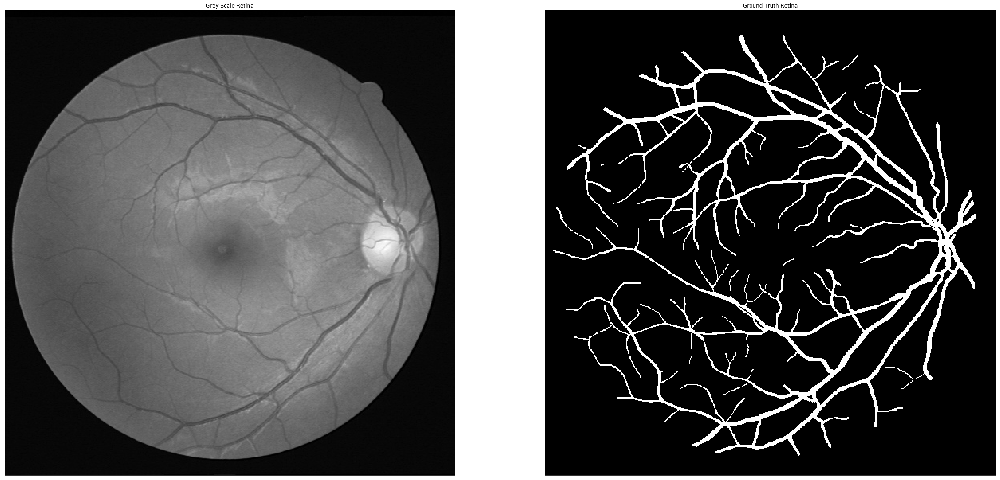

Retina_Images/38_training.tif
Ground_Truth_Images/38_manual1.gif


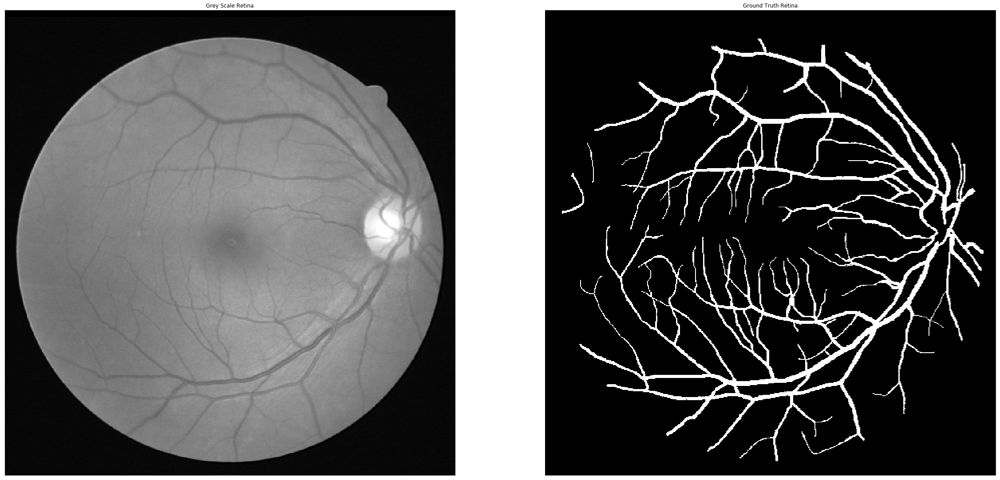

Retina_Images/39_training.tif
Ground_Truth_Images/39_manual1.gif


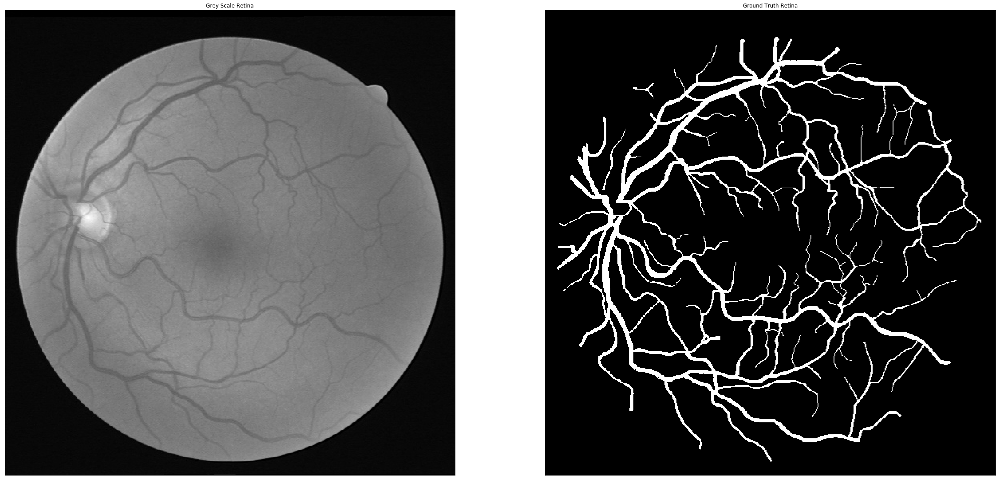

Retina_Images/40_training.tif
Ground_Truth_Images/40_manual1.gif


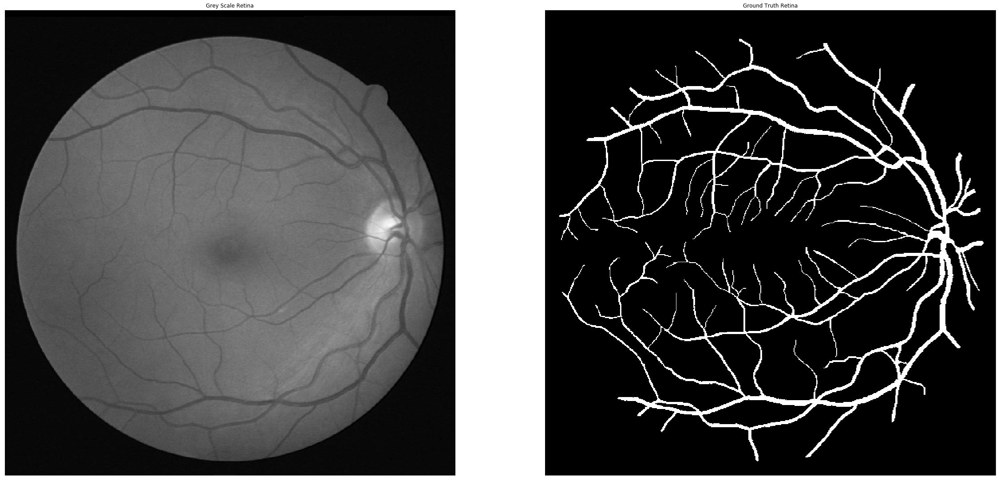

In [5]:
# Function loops from 1 (first image) to sume set number
for image_pairs_number in range(1,num_images+1):

    # Directory indexer, referencing to what image we are looking at 
    dir_index = image_pairs_number            

    # Generate image directory address in the form of string
    retina_image = x[dir_index]
    retina_ground_truth = y[dir_index-1]
    
    # Passing directory to be stored in retina_dir variable and ground_truth_dir
    retina_dir = 'Retina_Images/' + str(retina_image)
    ground_truth_dir = 'Ground_Truth_Images/'+ str(retina_ground_truth)
    print (retina_dir)
    print (ground_truth_dir)

    # Converting retina image into grey scale 
    retina = data.imread(retina_dir) 
    retina_grey = color.rgb2grey(retina)

    # Import corresponding ground truth image 
    retina_ground_truth1 = ground_truth_dir
    retina_ground_truth_image = data.imread(retina_ground_truth1)

    # Displaying retina image and its ground truth 
    plt.figure(figsize=(40,38))
    plt.subplot(121),plt.imshow(retina_grey,cmap="gray"),plt.title('Grey Scale Retina')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(retina_ground_truth_image,cmap="gray"),plt.title('Ground Truth Retina')
    plt.xticks([]), plt.yticks([])
    plt.show()

    # Only clear storage array if we starting looping from first image again  
    if dir_index == 1:
        stokes_list = []
        big_stokes = []
    
    # Function that select random patches and labels them with class 
    big_stokes = random_patches(retina_grey, retina_ground_truth_image,rand_pix)


                                Generate features matrix any grid size

In [6]:
# Populate csv file with features matrix that is generated, this will be used in machine learning
dfdf = pd.DataFrame(big_stokes)
dfdf.to_csv('patches.csv',index = False, header = False )